In [64]:
import pandas as pd
import numpy as np
from datetime import datetime
import scipy.stats 

In [2]:
dates= list(map(str,range(20171220, 20171232))) + list(map(str,range(20180101,20180121)))

dict_df={}
for date in dates:
    dict_df["df_{}".format(date)]=pd.read_csv("flights{}.csv".format(date))

In [147]:
df_flights=pd.concat(dict_df.values(), ignore_index=True)


In [5]:
#drop review url tab and drop rows for airline name: multiple airlines
df_flights.drop(["review_url"],axis=1, inplace=True)
df_flights=df_flights[df_flights["airline_name"]!="Multiple Airlines"]

In [6]:
#strip dollar sign, replace missing value with 0, convert to int
df_flights["flight_cost"]=df_flights["flight_cost"].replace(np.nan,"0")

df_flights["flight_cost"]=df_flights["flight_cost"].str.replace(',','')
df_flights["flight_cost"]=df_flights["flight_cost"].str.replace('$','')

df_flights["flight_cost"]=df_flights["flight_cost"].astype(int)


In [7]:
#strip Flyscore: in flight flyscore, replace missing value with 0, convert to float
df_flights["flight_flyscore"]=df_flights["flight_flyscore"].replace(np.nan,"0")
df_flights["flight_flyscore"]=df_flights["flight_flyscore"].apply(lambda x: x.strip('FlyScore:'))
df_flights["flight_flyscore"]=df_flights["flight_flyscore"].astype(float)


In [8]:
#strip airline rating, replace missing values with 0, convert to float
df_flights["airline_rating"]=df_flights["airline_rating"].replace(np.nan,"0")
df_flights["airline_rating"]=df_flights["airline_rating"].str.replace(' of 5 bubbles','')
df_flights["airline_rating"]=df_flights["airline_rating"].astype(float)


In [9]:
#strip airport in depart and arrive time, add new column for departure and arrival airport

def airport_column(column):
    
    split_list=column.apply(lambda x: x.split())

    airport=split_list.apply(lambda x: x[0])

    time= split_list.apply(lambda x: x[1]+x[2])

    return (airport,time)
    
df_flights["departure_airport"]=airport_column(df_flights["depart_time"])[0]
df_flights["depart_time"]= airport_column(df_flights["depart_time"])[1].apply(lambda x: x.replace('+1',''))


df_flights["arrival_airport"]=airport_column(df_flights["arrive_time"])[0]
df_flights["arrive_time"]=airport_column(df_flights["arrive_time"])[1].apply(lambda x: x.replace('+1',''))




In [148]:
#convert date to datetime
df_flights["date"]=pd.to_datetime(df_flights["date"])


In [11]:
#convert flight duration to minutes
list_flight_dur=df_flights["flight_duration"].apply(lambda x: x.split())

hour=list_flight_dur.apply(lambda x: x[0].replace('h','')).astype(int)*60

minutes= list_flight_dur.apply(lambda x: x[1].replace('m','')).astype(int)


df_flights["flight_duration"]= hour+minutes



In [149]:
print(df_flights.head())
#df_flights.to_csv("clean_flights.csv")

  airline_name flight_cost  depart_time    arrive_time flight_duration  \
0       United       $199   LGA 6:00 AM    LAX 3:28 PM         12h 28m   
1     Frontier       $259   LGA 9:20 AM    LAX 6:14 PM         11h 54m   
2       Spirit       $260   LGA 9:59 PM  LAX 8:26 AM+1         13h 27m   
3       United       $262   LGA 8:03 PM  LAX 1:37 AM+1          8h 34m   
4       United       $262   LGA 7:03 PM  LAX 1:37 AM+1          9h 34m   

  flight_flyscore    airline_rating       date  \
0   FlyScore: 6.5    3 of 5 bubbles 2017-12-20   
1   FlyScore: 4.8  2.5 of 5 bubbles 2017-12-20   
2   FlyScore: 4.8  2.5 of 5 bubbles 2017-12-20   
3   FlyScore: 7.2    3 of 5 bubbles 2017-12-20   
4   FlyScore: 6.9    3 of 5 bubbles 2017-12-20   

                                          review_url  
0  https://www.tripadvisor.com/Airline_Review-d87...  
1  https://www.tripadvisor.com/Airline_Review-d87...  
2  https://www.tripadvisor.com/Airline_Review-d87...  
3  https://www.tripadvisor.com/Air

In [12]:
import plotly.offline as offline
import plotly.graph_objs as go
from plotly import tools
offline.offline.init_notebook_mode(connected=True)

In [23]:
#plot mean flight cost over time for each destination

df_filter_cost= df_flights[df_flights["flight_cost"]!=0]
df_date_airport= df_filter_cost.groupby(['date','arrival_airport'], as_index=False)["flight_cost"].mean()

data=[]
for airport in df_date_airport["arrival_airport"].unique():
    df_airport=df_date_airport[df_date_airport["arrival_airport"]==airport]
    data.append(go.Scatter(x=df_airport["date"], y=df_airport["flight_cost"],name=airport))


layout = dict(
    title = "Average Flight Price Over Time by Destination",
    xaxis = dict(title='Date'),
    yaxis=dict(title='Flight Price($)'))

fig= dict(data=data, layout=layout)
offline.iplot(fig)

In [22]:
#plot flight cost by airline and destination

df_filter_cost= df_flights[df_flights["flight_cost"]!=0]
df_airline_airport= df_filter_cost.groupby(['date', 'arrival_airport','airline_name'],as_index=False)["flight_cost"].mean()


def flight_cost_airline_destination(df_airline_airport, dest):
    df_airline_dest= df_airline_airport[df_airline_airport["arrival_airport"]== dest]
    
    data=[]
    for airline in df_airline_dest["airline_name"].unique():
        df_airline=df_airline_dest[df_airline_dest["airline_name"]==airline]
        data.append(go.Scatter(x=df_airline["date"], y=df_airline["flight_cost"],name=airline))


    layout = dict(
        title = "Average Flight Price Over Time by Airline from NYC to {}".format(df_airline_dest.arrival_airport.unique()[0]),
        xaxis = dict(title='Date'),
        yaxis=dict(title='Flight Price ($)'))

    fig= dict(data=data, layout=layout)
    offline.iplot(fig)


flight_cost_airline_destination(df_airline_airport, "LAX")
flight_cost_airline_destination(df_airline_airport, "HNL")
flight_cost_airline_destination(df_airline_airport, "SFO")
flight_cost_airline_destination(df_airline_airport, "MIA")
flight_cost_airline_destination(df_airline_airport, "LAS")

             


In [66]:
# plot distribution of flight prices over 1 month (Dec to Jan)

df_dist= df_filter_cost.filter(['arrival_airport','airline_name','flight_cost'])

data=[df_dist["flight_cost"]]

fig=ff.create_distplot(data, ["flight_price"], curve_type='normal',bin_size=50)
fig['layout'].update(title='Distribution of Flight Prices From Dec 20 to Jan 20')
offline.iplot(fig)







C:\Users\hans\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1326: UserWarning:

p-value may not be accurate for N > 5000.



(0.8253012895584106, 0.0)

As seen above, the distribution of flight prices is right skewed ie. mean is greater than the median. Transformation of this distribution possibly log transformation will make data normal.

In [75]:
#plot distribution of flight cost by airline
import plotly.figure_factory as ff

df_dist= df_filter_cost.filter(['arrival_airport','airline_name','flight_cost'])



def distribution_airline_destination(df_dist, dest):
    df_airline_dest= df_dist[df_dist["arrival_airport"]== dest]
    
    
    data=[]
    for airline in df_airline_dest["airline_name"].unique():
        df_airline=df_airline_dest[df_airline_dest["airline_name"]==airline]

        data.append(go.Box(y=df_airline["flight_cost"],x=df_airline["arrival_airport"],name='{}'.format(airline)))

    #fig=ff.create_distplot(data, df_airline_dest["airline_name"].unique(), curve_type='normal',bin_size=50)
    #fig['layout'].update(title='Distribution of Flight Prices by Airline from NYC to {}'.format(dest))
    
    
    layout =go.Layout(title='Distribution of Flight Prices by Airline from NYC to {}'.format(dest),boxmode='group')
    
    fig=go.Figure(data=data,layout=layout)
    offline.iplot(fig)
    
    
    

distribution_airline_destination(df_dist, "LAX")
distribution_airline_destination(df_dist, "HNL")
distribution_airline_destination(df_dist, "SFO")
distribution_airline_destination(df_dist, "MIA")
distribution_airline_destination(df_dist, "LAS")

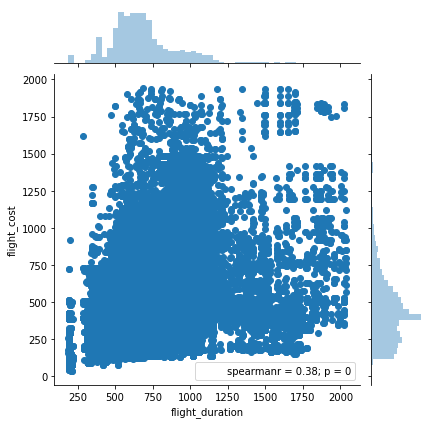

In [112]:
#plot ratings by airline, find correlation between rating, flight duration on flight cost
import seaborn as sns

%matplotlib inline

#remove outliers


df_dur_cost=df_filter_cost.filter(['flight_duration', 'flight_cost'])
df_dur_cost= df_dur_cost.loc[df_dur_cost.apply(lambda x: np.abs(x - x.mean()) / x.std() < 5).all(axis=1)]

sns.jointplot(df_dur_cost['flight_duration'], df_dur_cost['flight_cost'], stat_func=spearmanr)


In [111]:
# plot distribution of airline flight prices for Hawaii over time

df_dist_HWI=df_filter_cost[df_filter_cost["arrival_airport"]=="HNL"]

df_dist_HWI= df_dist_HWI.filter(['date','airline_name','flight_cost','arrival_airport'])




def distribution_Hawaii(df_dist_HWI, airline):
    df_airline_HWI= df_dist_HWI[df_dist_HWI["airline_name"]== airline]
    
    
    data=[]
    date_strings=df_airline_HWI["date"].apply(lambda x: x.strftime('%b %d,%Y')).unique()
    
    
    for date in df_airline_HWI["date"].unique():
        df_date_HWI=df_airline_HWI[df_airline_HWI["date"]==date]
        date_to_string=pd.to_datetime(str(date))
        date_to_string=date_to_string.strftime('%b %d,%Y')
        data.append(go.Box(y=df_date_HWI["flight_cost"],x= airline,name= date_to_string))
        
        
    layout =go.Layout(title='Distribution of Flight Prices by {} from NYC to HNL'.format(airline),boxmode='group',
                      xaxis= dict(tickangle=45,tickfont=dict(size=10)))
    
    fig=go.Figure(data=data,layout=layout)
    offline.iplot(fig)
    
    

distribution_Hawaii(df_dist_HWI, "Virgin America")
distribution_Hawaii(df_dist_HWI, "JetBlue")
distribution_Hawaii(df_dist_HWI, "Hawaiian")
distribution_Hawaii(df_dist_HWI, "American")
distribution_Hawaii(df_dist_HWI, "United")
distribution_Hawaii(df_dist_HWI, "Alaska")








In [146]:
#bar plot of frequency of flyscore ratings by airline

df_flyscore_cost=df_filter_cost.filter(['airline_name','flight_flyscore'])

df_flyscore_cost=df_flyscore_cost[df_flyscore_cost["flight_flyscore"]!=0]



data=[]
for airline in df_flyscore_cost["airline_name"].unique():
    df_airline_flyscore= df_flyscore_cost[df_flyscore_cost["airline_name"]== airline]
    data.append(df_airline_flyscore["flight_flyscore"])


fig=ff.create_distplot(data, df_flyscore_cost["airline_name"].unique(), curve_type='normal',bin_size=0.3)
fig['layout'].update(title='Distribution of Flight Flyscore by Airline')



offline.iplot(fig)